# Image compression with KMeans

This notebook contains analysis of image compression with KMeans with different k, initiaton initiation methods and distance type (Manhattan and Euclidean).

Initiation methods explored are:
* random_uniform: random centroids initialized from uniform distribution between min and max values for each axis.
* random_data: centroids are picked randomly from the datapoints.
* random_partition: each datapoint is assigned random cluster, the centroids of which are assigned as initial centroids.
* plusplus: first datapoint is selected to be the first centroid. Subsequent centroid is selected from the remaining datapoints with probability proportional to min squared distance to the already picked centroids.

Compressed images can be found in **'/data/pictures/compressed/'** folder.
Results can be found in **'/results/image_compression/'** folder.
Results indcluded are:
* cluster: m x 1 array of assigned cluster of each datapoints where m = # of datapoints
* centroids: k x dim array of centroids where k = # of clusters
* closest_centroids: m x dim array of centroids closest to the corresponding datapoints
* loss: sum of squared distance of all datapoints to their respective closest centroids
* initialization_time: time spent (in s) to perform initialization of centroids
* optimziation_time: time spent (in s) from the start of optimization loop to convergence
* iterations: # iterations until convergence

Each of the result and compression are done by repeating KMeans 5 times and picking the lowest loss.

In [1]:
import os
os.chdir(os.getcwd() + '/../../')

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

## 1. Convergence time

We will compare convergence time of KMeans image compression of 3 images with different k. Number of iterations as well as initialization and optimization time are compared (for simplicity, only Euclidean method with **KMeans++** (https://en.wikipedia.org/wiki/K-means%2B%2B) and **random_uniform initialization** (where random k datapoints are selected as initial centroids) are compared). All times are in seconds.

In [3]:
init_method = 'plusplus'
dist_type = 'l2'

df = pd.DataFrame()
df['k'] = [2, 4, 8, 16]

labels = ['football', 'gatech', 'interior']
for label in labels:
    df_ = pd.read_csv(f"results/image_compression/{label}_{init_method}_{dist_type}.csv", index_col=0)
    df[f"iters_{label}"] = df_['iterations']
    df[f"init_t_{label}"] = df_['initialization_time']
    df[f"optim_t_{label}"] = df_['optimization_time']

df

,k,iters_football,init_t_football,optim_t_football,iters_gatech,init_t_gatech,optim_t_gatech,iters_interior,init_t_interior,optim_t_interior
0,2,13,0.937500,0.453125,9,0.421875,0.171875,20,0.453125,0.437500
1,4,28,3.703125,1.484375,42,2.296875,1.453125,38,2.453125,1.406250
2,8,27,16.718750,3.078125,45,9.875000,2.859375,106,10.843750,7.765625
3,16,101,67.109375,22.312500,65,40.437500,8.531250,94,42.484375,13.015625


In [4]:
init_method = 'random_uniform'
dist_type = 'l2'

df = pd.DataFrame()
df['k'] = [2, 4, 8, 16]

labels = ['football', 'gatech', 'interior']
for label in labels:
    df_ = pd.read_csv(f"results/image_compression/{label}_{init_method}_{dist_type}.csv", index_col=0)
    df[f"iters_{label}"] = df_['iterations']
    df[f"init_t_{label}"] = df_['initialization_time']
    df[f"optim_t_{label}"] = df_['optimization_time']
    
df

,k,iters_football,init_t_football,optim_t_football,iters_gatech,init_t_gatech,optim_t_gatech,iters_interior,init_t_interior,optim_t_interior
0,2,31,0.000000,1.031250,11,0.015625,0.203125,22,0.0,0.453125
1,4,103,0.015625,5.468750,60,0.000000,2.078125,42,0.0,1.484375
2,8,58,0.000000,6.140625,63,0.000000,4.343750,83,0.0,5.890625
3,16,90,0.000000,19.359375,78,0.000000,10.312500,128,0.0,18.718750


KMeans++ runtimes are dominated by initialization times since it needs to loop through each datapoints and picked centroids to pick the next. However, optimization times can be shorter than random methods. In general runtime of KMeans clustering increases with K while number iterations can be lower for higher K due to faster convergence.

## 2. Compressed images

For simplicity, only pictures for random_uniform initialization method and l2 distance type are analyzed.

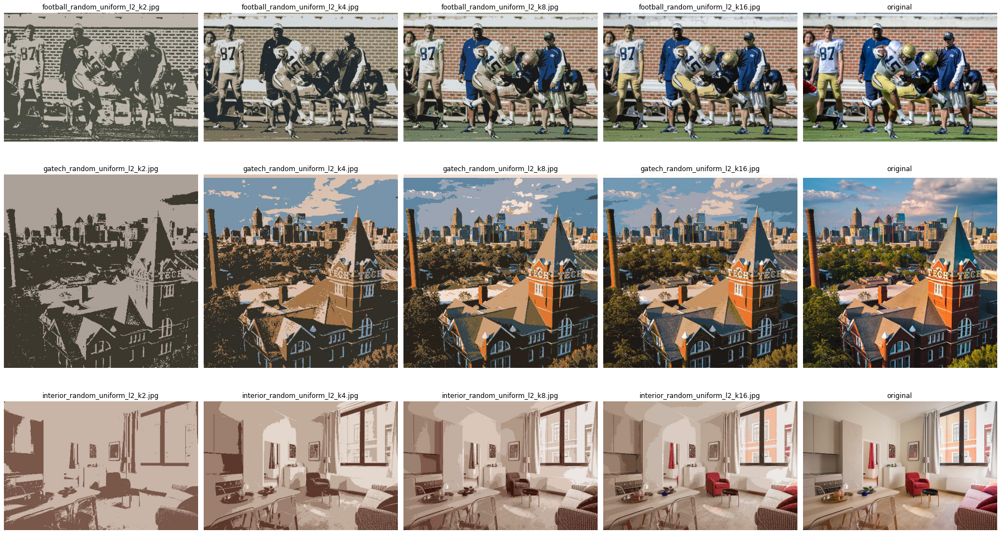

In [6]:
K = [2, 4, 8, 16]
labels = ['football', 'gatech', 'interior']
init_method = 'random_uniform'
dist_type = 'l2'

rows = 3
cols = 5

fig, ax = plt.subplots(rows, cols, figsize = (25, 15))

# compressed images
for i in range(rows):
    for j in range(cols-1):
        filename = f"{labels[i]}_{init_method}_{dist_type}_k{K[j]}.jpg"
        img = mpimg.imread(f"data/pictures/compressed/{filename}")
        index = i*rows + j
        ax[i, j].imshow(img)
        ax[i, j].set_title(filename)
     
# original image
ori_filenames = ['football.bmp', 'GeorgiaTech.bmp', 'interior.jpg']
for i in range(3):
    img = mpimg.imread(f"data/pictures/{ori_filenames[i]}")
    ax[i, 4].imshow(img)
    ax[i, 4].set_title('original')

for ax in fig.axes:
    ax.axis('off')
plt.tight_layout()

With k = 16 compressed pictures start to look very similar to original.

## 3. Importance of initialization strategy

In this section we will analyze an initialization strategy deliberately devised to be poor, called **inverted_plusplus** which is similar to **KMeans++** but with subsequent datapoints having higher probability of being picked as the next centroids if their minimum distances to the already-picked centroids are small. This should encourage initial centroids being in a close proximity to one another.

First we compare this startegy to the **random_uniform** and **KMeans++** in Euclidean distance type.

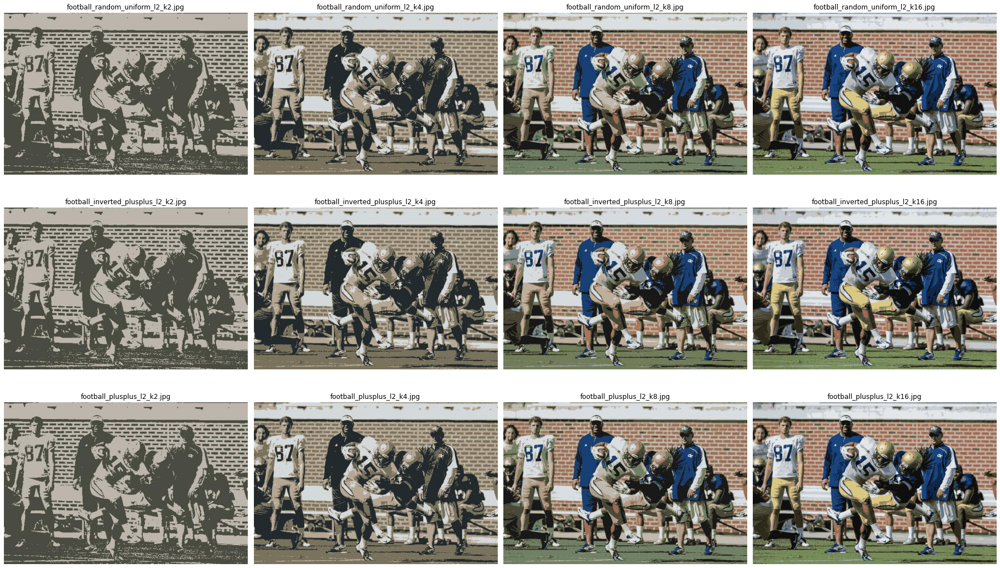

In [10]:
K = [2, 4, 8, 16]
labels = 'football'
init_method = ['random_uniform', 'inverted_plusplus', 'plusplus']
dist_type = 'l2'

rows = 3
cols = 4

fig, ax = plt.subplots(rows, cols, figsize = (25, 15))

# compressed images
for i in range(rows):
    for j in range(cols):
        filename = f"{labels}_{init_method[i]}_{dist_type}_k{K[j]}.jpg"
        img = mpimg.imread(f"data/pictures/compressed/{filename}")
        index = i*rows + j
        ax[i, j].imshow(img)
        ax[i, j].set_title(filename)

for ax in fig.axes:
    ax.axis('off')
plt.tight_layout()

The quality of compressed images is not noticeably different between the three initialization methods (the same result can be seen from the other two images). However, if we look at the runtimes for all three images:

In [13]:
init_methods = ['random_uniform', 'inverted_plusplus', 'plusplus']
dist_type = 'l2'

df = pd.DataFrame()
df['k'] = [2, 4, 8, 16]

labels = ['football', 'gatech', 'interior']

for init_method in init_methods:
    for label in labels:
        df_ = pd.read_csv(f"results/image_compression/{label}_{init_method}_{dist_type}.csv", index_col=0)
        df[f"iters_{label}"] = df_['iterations']
        df[f"init_t_{label}"] = df_['initialization_time']
        df[f"optim_t_{label}"] = df_['optimization_time']
    print(f"initialization method: {init_method}")
    display(df)

initialization method: random_uniform


,k,iters_football,init_t_football,optim_t_football,iters_gatech,init_t_gatech,optim_t_gatech,iters_interior,init_t_interior,optim_t_interior
0,2,31,0.000000,1.031250,11,0.015625,0.203125,22,0.0,0.453125
1,4,103,0.015625,5.468750,60,0.000000,2.078125,42,0.0,1.484375
2,8,58,0.000000,6.140625,63,0.000000,4.343750,83,0.0,5.890625
3,16,90,0.000000,19.359375,78,0.000000,10.312500,128,0.0,18.718750


initialization method: inverted_plusplus


,k,iters_football,init_t_football,optim_t_football,iters_gatech,init_t_gatech,optim_t_gatech,iters_interior,init_t_interior,optim_t_interior
0,2,26,0.687500,0.875000,12,0.437500,0.218750,19,0.546875,0.453125
1,4,55,3.765625,3.546875,60,2.265625,2.015625,28,2.546875,1.000000
2,8,59,17.359375,6.687500,96,10.140625,6.406250,52,10.265625,3.515625
3,16,279,67.203125,60.406250,159,43.343750,22.218750,173,43.218750,24.593750


initialization method: plusplus


,k,iters_football,init_t_football,optim_t_football,iters_gatech,init_t_gatech,optim_t_gatech,iters_interior,init_t_interior,optim_t_interior
0,2,13,0.937500,0.453125,9,0.421875,0.171875,20,0.453125,0.437500
1,4,28,3.703125,1.484375,42,2.296875,1.453125,38,2.453125,1.406250
2,8,27,16.718750,3.078125,45,9.875000,2.859375,106,10.843750,7.765625
3,16,101,67.109375,22.312500,65,40.437500,8.531250,94,42.484375,13.015625


We can see that the poor initialization method tends to have the longest total runtime: long initialization time (owing to its similarity to **KMeans++**) without the benefit of faster convergence. This is also reflected by the number of iterations needed to converge particularly at higher k.

## 4. Manhattan (l1) distance

### 4.1. Convergence times 

Similar to Section 1, we will compare **random_uniform** and **KMeans++** convergence times with l1 distance.

In [14]:
init_method = 'plusplus'
dist_type = 'l1'

df = pd.DataFrame()
df['k'] = [2, 4, 8, 16]

labels = ['football', 'gatech', 'interior']
for label in labels:
    df_ = pd.read_csv(f"results/image_compression/{label}_{init_method}_{dist_type}.csv", index_col=0)
    df[f"iters_{label}"] = df_['iterations']
    df[f"init_t_{label}"] = df_['initialization_time']
    df[f"optim_t_{label}"] = df_['optimization_time']

df

,k,iters_football,init_t_football,optim_t_football,iters_gatech,init_t_gatech,optim_t_gatech,iters_interior,init_t_interior,optim_t_interior
0,2,15,0.68750,0.437500,6,0.406250,0.109375,10,0.453125,0.187500
1,4,11,3.62500,0.546875,14,2.343750,0.453125,35,2.421875,1.234375
2,8,11,16.09375,1.015625,18,10.046875,1.156250,22,10.609375,1.484375
3,16,35,64.53125,6.812500,26,41.609375,3.265625,38,43.828125,5.312500


In [15]:
init_method = 'random_uniform'
dist_type = 'l1'

df = pd.DataFrame()
df['k'] = [2, 4, 8, 16]

labels = ['football', 'gatech', 'interior']
for label in labels:
    df_ = pd.read_csv(f"results/image_compression/{label}_{init_method}_{dist_type}.csv", index_col=0)
    df[f"iters_{label}"] = df_['iterations']
    df[f"init_t_{label}"] = df_['initialization_time']
    df[f"optim_t_{label}"] = df_['optimization_time']

df

,k,iters_football,init_t_football,optim_t_football,iters_gatech,init_t_gatech,optim_t_gatech,iters_interior,init_t_interior,optim_t_interior
0,2,15,0.0,0.453125,7,0.000000,0.125000,7,0.000000,0.156250
1,4,11,0.0,0.593750,19,0.000000,0.593750,40,0.015625,1.328125
2,8,20,0.0,1.921875,16,0.015625,0.984375,13,0.000000,0.843750
3,16,35,0.0,6.953125,42,0.000000,5.328125,37,0.000000,4.953125


Obviously the same trend still exists. However, l1 optimization seems to converge faster that l2.

### 4.2 Compressed images

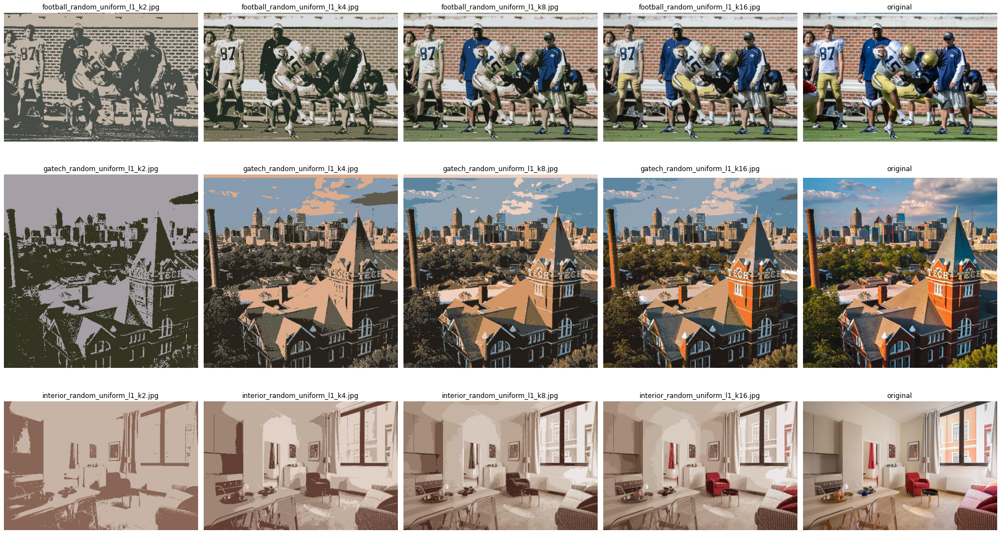

In [17]:
K = [2, 4, 8, 16]
labels = ['football', 'gatech', 'interior']
init_method = 'random_uniform'
dist_type = 'l1'

rows = 3
cols = 5

fig, ax = plt.subplots(rows, cols, figsize = (25, 15))

# compressed images
for i in range(rows):
    for j in range(cols-1):
        filename = f"{labels[i]}_{init_method}_{dist_type}_k{K[j]}.jpg"
        img = mpimg.imread(f"data/pictures/compressed/{filename}")
        index = i*rows + j
        ax[i, j].imshow(img)
        ax[i, j].set_title(filename)
     
# original image
ori_filenames = ['football.bmp', 'GeorgiaTech.bmp', 'interior.jpg']
for i in range(3):
    img = mpimg.imread(f"data/pictures/{ori_filenames[i]}")
    ax[i, 4].imshow(img)
    ax[i, 4].set_title('original')

for ax in fig.axes:
    ax.axis('off')
plt.tight_layout()

Interestingly, there seems to be a trend that l1 method does not pick up hues as well as l2 method. This is particularly visible in GeorgiaTech picture especially at k=4 and k=8. Here we will look at **random_uniform** initialized compressed images, however, the trend is also present in the three other initialization methods.

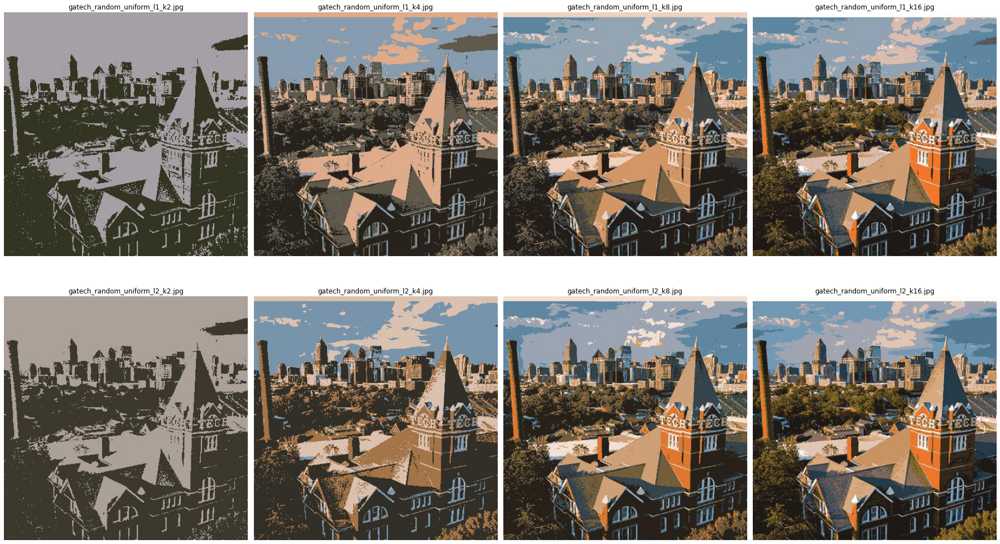

In [20]:
K = [2, 4, 8, 16]
labels = 'gatech'
init_method = 'random_uniform'
dist_types = ['l1', 'l2']

rows = 2
cols = 4

fig, ax = plt.subplots(rows, cols, figsize = (25, 15))

# compressed images
for i in range(rows):
    for j in range(cols):
        filename = f"{labels}_{init_method}_{dist_types[i]}_k{K[j]}.jpg"
        img = mpimg.imread(f"data/pictures/compressed/{filename}")
        index = i*rows + j
        ax[i, j].imshow(img)
        ax[i, j].set_title(filename)

for ax in fig.axes:
    ax.axis('off')
plt.tight_layout()

This phenonemon perhaps can be explained by the intuition that Manhattan method punishes distance linearly as opposed to Euclidean method where large distance in one axes (with small distance in the other two axes/color components) dominates and is punished more severely by squaring. As a result, minimization of l1 distance by median is more forgiving towards datapoints which have high similarities in 2 colors/axes while having much lower similarity in the third axis/color. 